<a href="https://colab.research.google.com/github/abhuday-sudhir/dog_breed_detection/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "drive/MyDrive/dog vision/dog-breed-identification.zip" -d "drive/MyDrive/dog vision/"

# **End to End dog breed classification using tensorflow**

#Getting our workflow ready
*Importing tensor flow
*Importing tensorflow hub
*Using a GPU

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__,hub.__version__

('2.15.0', '0.16.1')

In [ ]:
print("GPU"," available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Not Available


# **GETTING OUR DATA READY(TURNING INTO TENSOR)**
We will be turning images into tensor(numerics)

In [ ]:
import pandas as pd
df=pd.read_csv("drive/MyDrive/dog vision/labels.csv")
print(df.describe())
df

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


<Axes: xlabel='breed'>

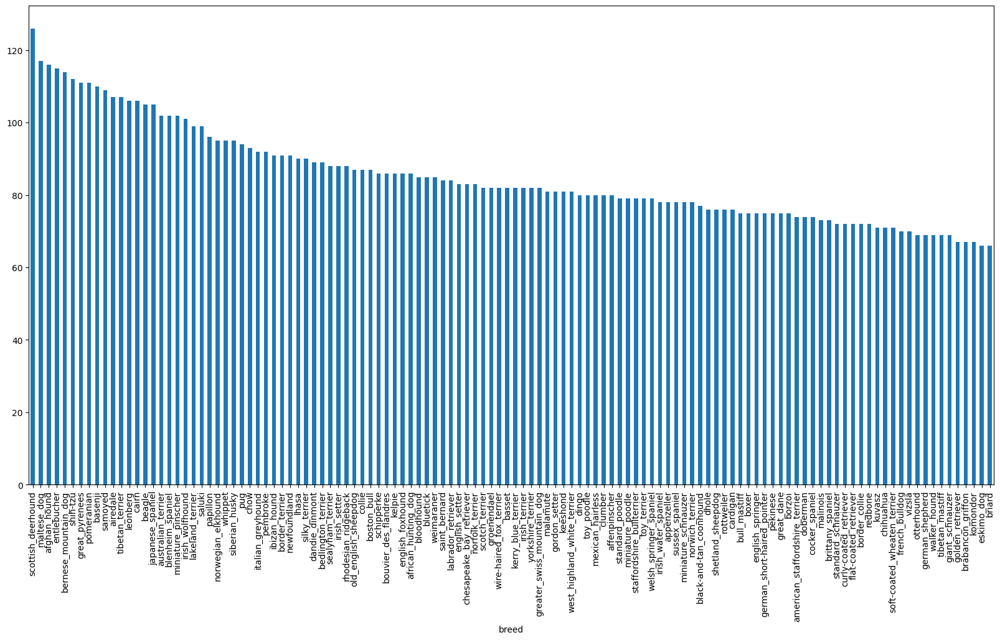

In [ ]:
df["breed"].value_counts().plot.bar(figsize=(20,10))

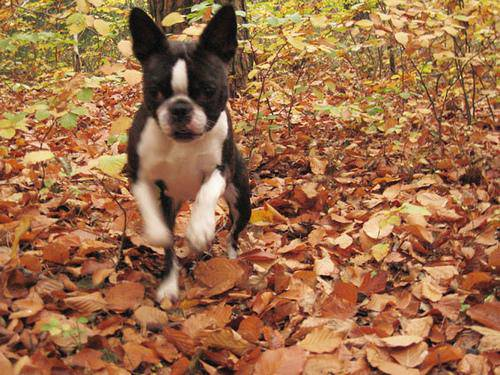

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

**CREATING LIST PF PATHS OF IMAGES**

In [ ]:
filename=(["drive/MyDrive/dog vision/train/"+fname+".jpg" for fname in df["id"]]);
filename[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
len(os.listdir("drive/MyDrive/dog vision/train/"))
len(filename)

10222

In [ ]:
#Checking for o. of filename matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog vision/train/"))==len(filename):
  print("Filename matches nunber of actual actual files")
else:
  print("no")

no


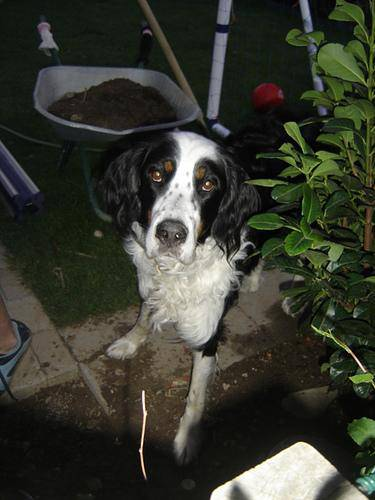

In [ ]:
Image(filename[2000])

In [ ]:
df["breed"][2000]

'appenzeller'

*Now getting our labels ready*

In [ ]:
import numpy as np
labels=df["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(filename)==len(labels):
  print("yes")

yes


In [ ]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

*Turning every label into boolean array*

In [ ]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Turning boolean array into numbers
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# for i in range(0,len(boolean_labels)):
  # boolean_labels[i]=boolean_labels[i].astype(int)

In [ ]:
# boolean_labels[:5]

In [ ]:
len(boolean_labels)

10222

# Creating our own validation set

In [ ]:
x=filename
y=boolean_labels

**We will start with only 1000 images and increase according because it takes much time to train**

In [ ]:
#Setting number of images for experimenting
num_images=1000#@param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:
#Creating our training and validation data using sklearn
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:num_images],y[:num_images],test_size=0.2,random_state=42)

In [ ]:


len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:5],y_train[:5]

(['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

# **Preprocessing images and turning them into  tensors**
 * manipulating a file path is easier than manipulating images

In [ ]:
#converting a image to numpy array
from matplotlib.pyplot import imread
img=imread(filename[45])
img.shape

(375, 500, 3)

array([[[85, 66, 60],
        [86, 67, 61],
        [84, 65, 59],
        ...,
        [41, 26, 23],
        [48, 33, 30],
        [51, 36, 33]],

       [[85, 66, 60],
        [89, 70, 64],
        [88, 69, 63],
        ...,
        [51, 36, 33],
        [58, 43, 40],
        [61, 46, 43]],

       [[90, 71, 65],
        [96, 77, 71],
        [96, 77, 71],
        ...,
        [59, 44, 41],
        [66, 51, 48],
        [70, 55, 52]],

       ...,

       [[45, 28, 20],
        [48, 31, 23],
        [47, 30, 22],
        ...,
        [54, 40, 31],
        [54, 40, 31],
        [54, 40, 31]],

       [[42, 25, 17],
        [45, 28, 20],
        [46, 29, 21],
        ...,
        [55, 41, 32],
        [55, 41, 32],
        [55, 41, 32]],

       [[38, 21, 13],
        [43, 26, 18],
        [45, 28, 20],
        ...,
        [57, 43, 34],
        [57, 43, 34],
        [57, 43, 34]]], dtype=uint8)
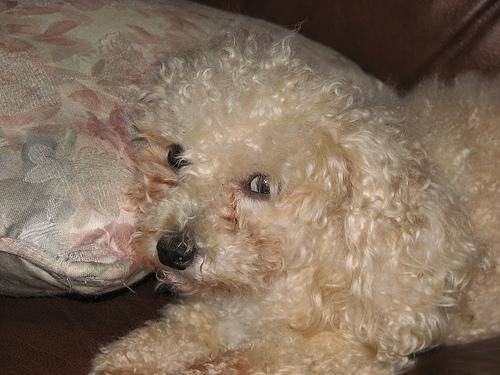

In [ ]:
img

In [ ]:
#converting numpy array into tensors
tf.constant(img)


<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[85, 66, 60],
        [86, 67, 61],
        [84, 65, 59],
        ...,
        [41, 26, 23],
        [48, 33, 30],
        [51, 36, 33]],

       [[85, 66, 60],
        [89, 70, 64],
        [88, 69, 63],
        ...,
        [51, 36, 33],
        [58, 43, 40],
        [61, 46, 43]],

       [[90, 71, 65],
        [96, 77, 71],
        [96, 77, 71],
        ...,
        [59, 44, 41],
        [66, 51, 48],
        [70, 55, 52]],

       ...,

       [[45, 28, 20],
        [48, 31, 23],
        [47, 30, 22],
        ...,
        [54, 40, 31],
        [54, 40, 31],
        [54, 40, 31]],

       [[42, 25, 17],
        [45, 28, 20],
        [46, 29, 21],
        ...,
        [55, 41, 32],
        [55, 41, 32],
        [55, 41, 32]],

       [[38, 21, 13],
        [43, 26, 18],
        [45, 28, 20],
        ...,
        [57, 43, 34],
        [57, 43, 34],
        [57, 43, 34]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224
#Creating a function for image processing
def process_image(path,img_size=IMG_SIZE):
  """
  Takes an image path and converts it into tensors
  """
  #Reading an image file
  image=tf.io.read_file(path)
  #Converting image into numeric tensors
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert color channel values from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resizing the image
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


#CONVERTING DATA INTO BATCHES
**Finding patterns in batches =32 is much easier than finding patterns in 10000 images and they all might not fit in memory.**

In [ ]:
def get_image_label(path,label):
  image=process_image(path)
  return image,label


In [ ]:
get_image_label(x[20],tf.constant(y[20]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.4686362 , 0.48284388, 0.4388923 ],
         [0.43491846, 0.46069017, 0.4125102 ],
         [0.45447832, 0.4979307 , 0.44302875],
         ...,
         [0.43456125, 0.5049195 , 0.28860298],
         [0.39823228, 0.4980573 , 0.26960978],
         [0.37409884, 0.48390275, 0.24988663]],
 
        [[0.43431306, 0.46279556, 0.4211807 ],
         [0.43068317, 0.4688092 , 0.42564145],
         [0.45039746, 0.49808303, 0.45071962],
         ...,
         [0.43917897, 0.51070905, 0.3056251 ],
         [0.3906706 , 0.4944172 , 0.2534024 ],
         [0.34645557, 0.4601811 , 0.20911317]],
 
        [[0.41501755, 0.4622952 , 0.4238247 ],
         [0.40084037, 0.4505865 , 0.40968493],
         [0.44426945, 0.4941148 , 0.45284492],
         ...,
         [0.4272146 , 0.50133634, 0.31526017],
         [0.38620418, 0.48767138, 0.25313336],
         [0.33333334, 0.44705886, 0.19360997]],
 
        ...,
 
        [[0.8738844 , 0.8699628 

In [ ]:
## Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batch(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data = data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Creating training and validation data batches
train_data=create_data_batch(x_train,y_train)
valid_data=create_data_batch(x_val,y_val,valid_data=True)
train_data,valid_data

Creating training data batches...
Creating validation data batches...


(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt
def show_images(image,labels):
  plt.figure(figsize=(15,15))
  # fig,ax=plt.subplots(5,5,figsize=(15,15))
  # fig.tight_layout()
  for i in range (25):
    ax=plt.subplot(5,5,i+1)

    plt.imshow(image[i])
    # plt.xlabel(labels[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")





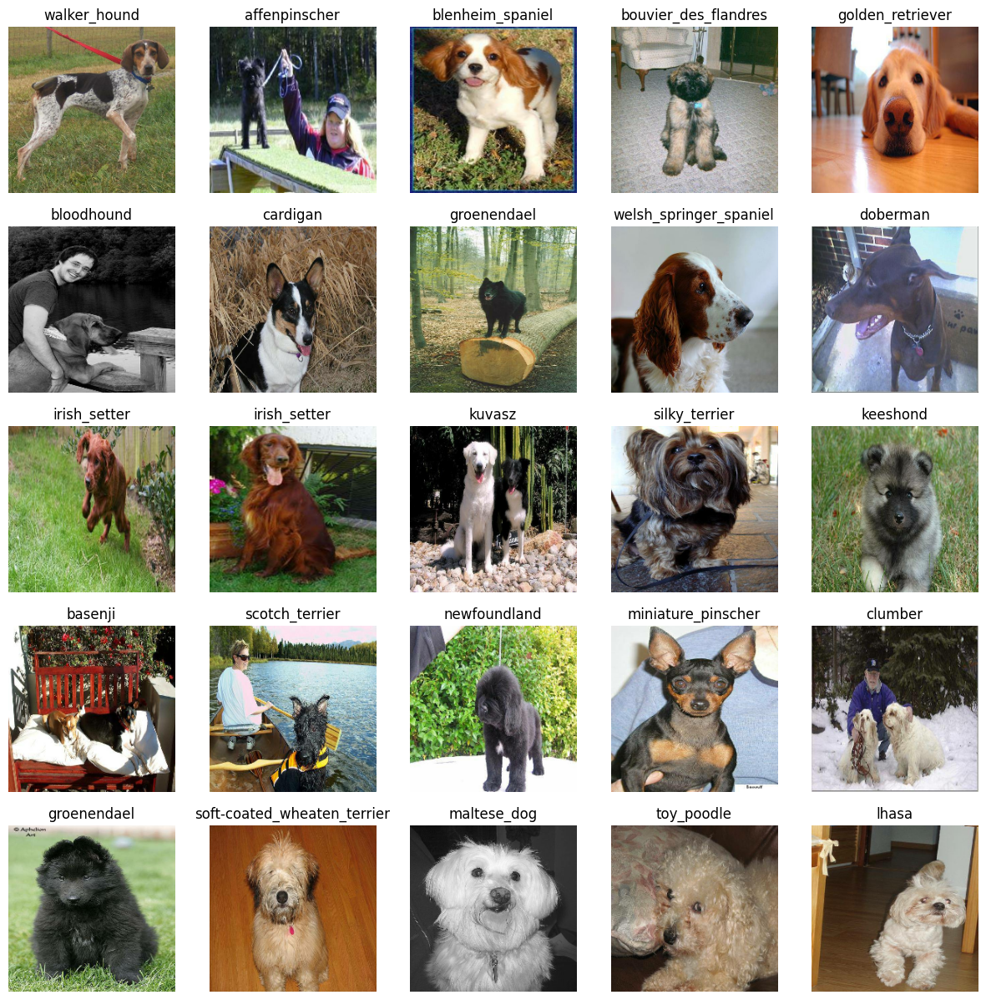

In [ ]:
train_images , train_labels=next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)
# train_images

In [ ]:
IMG_SIZE

224

In [ ]:
INPUT_SHAPE=[None, IMG_SIZE,IMG_SIZE,3]# batches, height,widht,color channels

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

**Creating a function to create a sequential model**

In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  #Setting up model
  model=tf.keras.Sequential([hub.KerasLayer(model_url),#layer 1
                             tf.keras.layers.Dense(units=output_shape,activation="softmax")#layer 2
                             ])
  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["Accuracy"]
  )
  #Build the model
  model.build(input_shape)

  return model

In [ ]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
model.layers

##Creating call backs



###TensorBoard Callback

In [ ]:
%load_ext tensorboard


In [ ]:
import datetime
def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/dog vision/logs",datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


###Early Stopping CallBack

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_Accuracy",
                                                patience=10)

**TRAINING OUR MODEL**

In [ ]:
num_epochs=100 #@param {type:"slider",min:100,max:1000,step:100}

In [ ]:
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


In [ ]:
def train_model():
  #creating a model
  model=create_model()

  #Create new tensorboard session everytime we train a session
  tensorboard_callback=create_tensorboard_callback()

  #Fitting the model
  model.fit(x=train_data,
            epochs=num_epochs,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard_callback,early_stopping])
  return model

In [ ]:
model=train_model()

Epoch 1/100
25/25 [==============================] - 76s 3s/step - loss: 4.5217 - Accuracy: 0.0750 - val_loss: 3.4088 - val_Accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 71s 3s/step - loss: 1.5712 - Accuracy: 0.7312 - val_loss: 2.1744 - val_Accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 68s 3s/step - loss: 0.5465 - Accuracy: 0.9337 - val_loss: 1.7228 - val_Accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 68s 3s/step - loss: 0.2497 - Accuracy: 0.9875 - val_loss: 1.5186 - val_Accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 60s 2s/step - loss: 0.1469 - Accuracy: 0.9987 - val_loss: 1.4369 - val_Accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 68s 3s/step - loss: 0.1001 - Accuracy: 0.9987 - val_loss: 1.3803 - val_Accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 68s 3s/step - loss: 0.0753 - Accuracy: 0.9987 - val_loss: 1.3562 - val_Accuracy: 0.6500
Epoch 8/100
2

####Checking the tensorboard logs

In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

##Making prediction using a trained model

In [ ]:
predictions=model.predict(valid_data,
                          verbose=1)
predictions

7/7 [==============================] - 62s 2s/step


array([[2.2350249e-03, 1.1028706e-04, 1.0656950e-03, ..., 4.6351930e-04,
        5.5962682e-06, 5.4555042e-03],
       [7.3530045e-03, 1.8259602e-04, 3.1651728e-02, ..., 1.6441818e-03,
        3.1152403e-03, 5.1501830e-04],
       [8.1772687e-06, 5.0180824e-05, 2.2496071e-04, ..., 7.9956357e-05,
        1.3892146e-05, 1.6315514e-04],
       ...,
       [7.2777016e-06, 6.1475839e-05, 1.5143600e-04, ..., 5.4101397e-06,
        2.6433774e-05, 3.4336095e-05],
       [2.3695158e-03, 5.0002028e-04, 4.8307012e-04, ..., 1.7266021e-04,
        2.4923001e-04, 2.7096001e-02],
       [5.9192174e-04, 8.1572589e-06, 6.6500450e-03, ..., 4.1875499e-03,
        2.1381029e-03, 1.8319882e-04]], dtype=float32)

**Now the above numbers depict the probablity of an image to be particular breed so when we add up the probability , it will nearly sum upto 1.**

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(predictions)

200

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
index=42
print(predictions[index])
print(f"Probability of Prediction: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted Label : {unique_breeds[np.argmax(predictions[index])]}")


[7.91878410e-05 6.09321323e-05 2.61276000e-05 5.10837926e-05
 7.62015348e-04 4.17126081e-04 1.60800864e-05 3.07056447e-03
 5.43798693e-03 4.22586165e-02 2.50236753e-05 8.46719649e-06
 1.62032768e-04 1.42105750e-03 8.84593348e-04 1.14456378e-02
 1.46456241e-05 4.55175497e-04 1.04347484e-04 8.82338674e-04
 1.80804564e-04 7.23192061e-04 3.04937821e-05 1.36100143e-05
 5.73152537e-03 3.70281887e-05 1.86266152e-05 1.89568764e-05
 1.94849170e-04 3.95640091e-05 2.30578473e-04 1.27141437e-04
 1.16416513e-05 1.26049845e-05 1.04088022e-05 3.79518278e-05
 4.11468463e-05 3.32924916e-04 2.25654985e-05 1.41551271e-01
 2.15997832e-04 9.19209742e-06 3.26415990e-03 4.27982923e-06
 1.65914491e-04 1.26014216e-04 1.17190968e-04 5.20611124e-04
 7.27112129e-05 6.56971883e-04 4.62448224e-05 3.07463451e-05
 1.27807638e-04 9.28717025e-04 2.15805812e-05 3.70401627e-04
 2.02279014e-04 6.08654045e-05 3.74815354e-05 7.70768293e-06
 5.53828067e-05 1.36271003e-04 8.67416657e-06 4.45332662e-05
 5.64964175e-05 2.338399

In [ ]:
unique_breeds[113]

'walker_hound'

In [ ]:
#Creating a function to predict label

def predict_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=predict_label(predictions[0])
pred_label



'cairn'

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

**Since our valid data is in batches we need to unbatch it*

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[1], valid_labels[1]

(array([[[0.96018916, 0.97587544, 0.979797  ],
         [0.9617217 , 0.977408  , 0.98132956],
         [0.9651424 , 0.9808287 , 0.9847503 ],
         ...,
         [0.95294124, 0.9725491 , 0.9960785 ],
         [0.94906336, 0.9686712 , 0.9922006 ],
         [0.94802153, 0.9676294 , 0.9911588 ]],
 
        [[0.97587544, 0.9915617 , 0.9954833 ],
         [0.9765078 , 0.99219406, 0.9961156 ],
         [0.9802049 , 0.99589115, 0.99981266],
         ...,
         [0.96018916, 0.979797  , 1.        ],
         [0.9563113 , 0.9759191 , 0.9994114 ],
         [0.95366776, 0.9732756 , 0.99680495]],
 
        [[0.9686275 , 0.9843138 , 0.98823535],
         [0.9689829 , 0.98466915, 0.9885907 ],
         [0.972765  , 0.9884513 , 0.9923729 ],
         ...,
         [0.9677083 , 0.98731613, 1.        ],
         [0.9650211 , 0.9846289 , 1.        ],
         [0.9610995 , 0.98070735, 0.9960785 ]],
 
        ...,
 
        [[0.29487073, 0.40404442, 0.24774945],
         [0.13160652, 0.22889124, 0.11186

**Now we have to get**:

* Prediction labels

* Validation Images

* Validation Labels

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=23):
  pred_prob, true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=predict_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
            color=color)


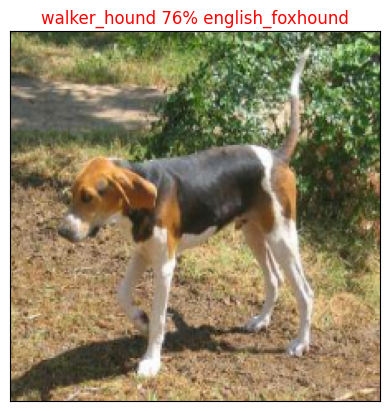

In [ ]:
plot_pred(predictions,valid_labels,valid_images,n=42)

#Creating a plot to show TOP 10 predictions

In [ ]:
def plot_pred_top(predictions,labels,n=1):
  pred_prob,true_label=predictions[n],labels[n]
  pred_label=predict_label(pred_prob)

  #Top 10 prediction indexex
  top_10_index=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_index]

  top_10_pred_labels=unique_breeds[top_10_index]

  plot=plt.bar(np.arange(len(top_10_pred_labels)),
               top_10_pred_values,
               color="red")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical"
             )
  if np.isin(true_label,top_10_pred_labels):
    plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass



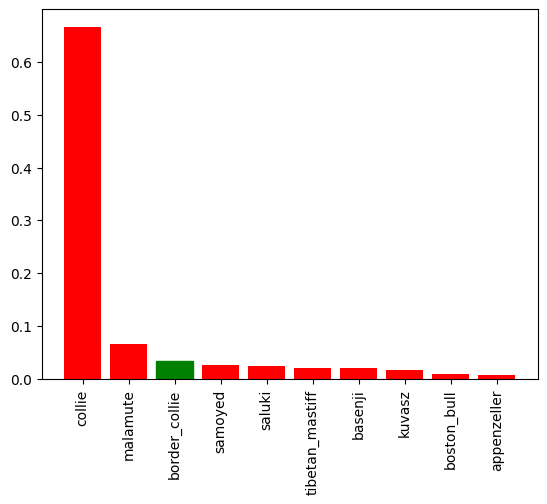

In [ ]:
plot_pred_top(predictions,valid_labels,n=9)

In [ ]:
# predictions[0]

In [ ]:
# predictions[0].argsort()

In [ ]:
# predictions[0].argsort()[-10:][::-1]

In [ ]:
# predictions[0][predictions[0].argsort()[-10:][::-1]]

In [ ]:
# unique_breeds[predictions[0].argsort()[-10:][::-1]]

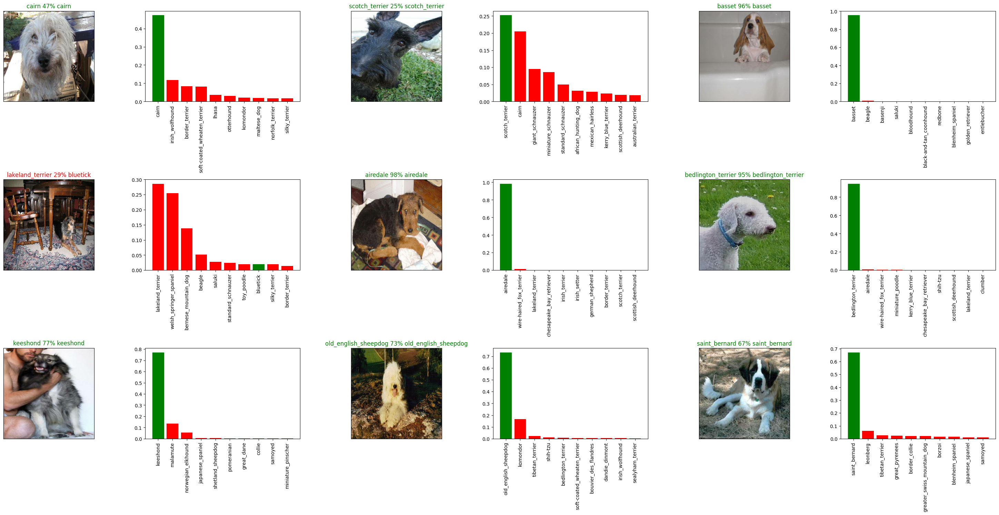

In [ ]:
rows=3
col=3

n=rows*col
plt.figure(figsize=(col*10,rows*5))
for i in range(n):
  plt.subplot(rows,
               col *2,
               2*i+1)
  plot_pred(predictions,valid_labels,valid_images,n=i)
  plt.subplot(rows,
               col *2,
               2*i+2)
  plot_pred_top(predictions,valid_labels,n=i)
plt.tight_layout()
plt.show()

##Saving and loading model

In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join("drive/MyDrive/dog vision/models",
                        datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  model_path=modeldir+"-"+suffix+".h5"
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
path=save_model(model,suffix="1000_images_mobilenetV2_Adam")
loaded_model=load_model(path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 20s 3s/step - loss: 1.2863 - Accuracy: 0.6600


[1.2863317728042603, 0.6600000262260437]

In [ ]:
loaded_model.evaluate(valid_data)

7/7 [==============================] - 16s 2s/step - loss: 1.2863 - Accuracy: 0.6600


[1.2863317728042603, 0.6600000262260437]